# User Experience Analytics

## Imports

In [2]:
import pickle
import numpy as np
import pandas as pd
from math import floor
from sqlalchemy import create_engine
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from scipy.stats import zscore
from sklearn.linear_model import LinearRegression
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler, normalize
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from sqlalchemy import create_engine
import sys, os

In [3]:
from sqlalchemy import create_engine
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', None)
pd.set_option("expand_frame_repr", False)
pd.set_option('display.float_format', '{:.2f}'.format)

In [4]:
sys.path.append(os.path.abspath(os.path.join('../scripts')))
from outlier_handler import OutlierHandler
from data_visualizer import *
#from vis_plotly import *

## Data Loading

In [6]:
df = pd.read_csv("../src/data/my_clean_data2.csv")
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 146887 entries, 0 to 146886
Data columns (total 55 columns):
 #   Column                            Non-Null Count   Dtype  
---  ------                            --------------   -----  
 0   Unnamed: 0                        146887 non-null  int64  
 1   Bearer Id                         146887 non-null  int64  
 2   Start                             146887 non-null  object 
 3   Start ms                          146887 non-null  float64
 4   End                               146887 non-null  object 
 5   End ms                            146887 non-null  float64
 6   IMSI                              146887 non-null  int64  
 7   MSISDN/Number                     146887 non-null  int64  
 8   IMEI                              146887 non-null  int64  
 9   Last Location Name                146887 non-null  object 
 10  Avg RTT DL (ms)                   146887 non-null  float64
 11  Avg RTT UL (ms)                   146887 non-null  f

In [7]:
user_engagements = pd.read_csv("../src/data/TellCo_user_engagements2.csv")
user_engagements.head(5)

,MSISDN/Number,cluster,user_sessions,time_duration,Total Data Volume (Bytes)
0,33601001000.00,1,2.00,297951104.00,1035550192.00
1,33601004000.00,1,1.00,134969376.00,595966468.00
2,33601008000.00,2,3.00,86982478.00,1879731670.00
3,33601010000.00,1,2.00,253983072.00,615217231.00
4,33601012000.00,1,3.00,214760500.00,985801575.00


In [9]:
user_experiance = pd.read_csv("../src/data/TellCo_user_experience_data.csv")
user_experiance.head(5)

,MSISDN/Number,total_avg_rtt,total_avg_tp,total_avg_tcp,Handset Type
0,33601001472,77.00,175.00,10581256.50,Apple iPhone 7 (A1778)
1,33601003520,59.00,97.00,4150403.00,undefined
2,33601007616,203.00,43452.50,8049700.50,Apple iPhone Se (A1723)
3,33601009664,101.00,7908.00,43952.00,Samsung Galaxy A8 (2018)
4,33601011712,105.00,43760.00,130637.00,Huawei Mate 10 Pro Porsche Design Huawei Mate 10


1. Engagement score to each user. Consider the engagement score as the Euclidean distance between the user data point & the less engaged cluster(use the first clustering for this)(Euclidean Distance)

In [11]:
with open("../models/TellCo_user_engagement2.pkl", "rb") as f:
    kmeans1 = pickle.load(f)
    kmeans1.n_init = 'auto'

In [12]:
less_engagement = 3

- Distance between the centroid and samples

In [13]:
eng_df = user_engagements.set_index('MSISDN/Number')[
    ['time_duration', 'Total Data Volume (Bytes)', 'user_sessions']]
scaler = StandardScaler()
scaled_array = scaler.fit_transform(eng_df)
pd.DataFrame(scaled_array).head(5)


,0,1,2
0,-0.21,-0.49,-0.53
1,-0.67,-0.75,-0.83
2,-0.81,0.02,-0.23
3,-0.34,-0.74,-0.53
4,-0.45,-0.52,-0.23


In [14]:
data_normalized = normalize(scaled_array)
pd.DataFrame(data_normalized).head(5)

,0,1,2
0,-0.28,-0.65,-0.70
1,-0.52,-0.58,-0.64
2,-0.96,0.02,-0.27
3,-0.35,-0.76,-0.55
4,-0.62,-0.72,-0.32


In [15]:
distance = kmeans1.fit_transform(data_normalized)
distance_from_less_engagement = list(
    map(lambda x: x[less_engagement], distance))
user_engagements['engagement_score'] = distance_from_less_engagement
user_engagements.head(5)

,MSISDN/Number,cluster,user_sessions,time_duration,Total Data Volume (Bytes),engagement_score
0,33601001000.00,1,2.00,297951104.00,1035550192.00,0.93
1,33601004000.00,1,1.00,134969376.00,595966468.00,1.10
2,33601008000.00,2,3.00,86982478.00,1879731670.00,1.57
3,33601010000.00,1,2.00,253983072.00,615217231.00,0.94
4,33601012000.00,1,3.00,214760500.00,985801575.00,1.16


- Considering the experience score as the Euclidean distance between the user data point & the worst experience’s cluster members


In [16]:
with open("../models/TellCo_user_experiance.pkl", "rb") as f:
    kmeans2 = pickle.load(f)
    kmeans2.n_init='auto'

In [17]:
worst_experiance = 0

In [18]:
exp_df = user_experiance.set_index('MSISDN/Number')[
    ['total_avg_rtt', 'total_avg_tp', 'total_avg_tcp']]
scaler = StandardScaler()
scaled_array = scaler.fit_transform(exp_df)
pd.DataFrame(scaled_array).head(5)

,0,1,2
0,-0.57,-0.58,0.15
1,-0.62,-0.58,-0.35
2,-0.19,-0.08,-0.05
3,-0.49,-0.49,-0.66
4,-0.48,-0.08,-0.66


In [19]:
data_normalized = normalize(scaled_array)
pd.DataFrame(data_normalized).head(5)

,0,1,2
0,-0.69,-0.70,0.18
1,-0.68,-0.63,-0.38
2,-0.90,-0.38,-0.21
3,-0.51,-0.51,-0.69
4,-0.59,-0.09,-0.80


In [20]:
exp_df = user_experiance.set_index('MSISDN/Number')
distance = kmeans2.fit_transform(data_normalized)
distance_from_worest_experiance = list(
    map(lambda x: x[worst_experiance], distance))
user_experiance['experience_score'] = distance_from_worest_experiance
user_experiance.head(5)

,MSISDN/Number,total_avg_rtt,total_avg_tp,total_avg_tcp,Handset Type,experience_score
0,33601001472,77.00,175.00,10581256.50,Apple iPhone 7 (A1778),1.15
1,33601003520,59.00,97.00,4150403.00,undefined,0.76
2,33601007616,203.00,43452.50,8049700.50,Apple iPhone Se (A1723),0.73
3,33601009664,101.00,7908.00,43952.00,Samsung Galaxy A8 (2018),0.58
4,33601011712,105.00,43760.00,130637.00,Huawei Mate 10 Pro Porsche Design Huawei Mate 10,0.23


Consider the average of both engagement & experience scores as the satisfaction score & report the top 10 satisfied customer


In [21]:
user_id_engagement = user_engagements['MSISDN/Number'].values
user_id_experiance = user_experiance['MSISDN/Number'].values
user_intersection = list(
    set(user_id_engagement).intersection(user_id_experiance))
user_intersection[:5]

[np.int64(33601024000),
 np.int64(33601280000),
 np.int64(33603072000),
 np.int64(33603584000),
 np.int64(33601792000)]

In [22]:
user_engagement_df = user_engagements[user_engagements['MSISDN/Number'].isin(
    user_intersection)]
user_engagement_df.shape

(262, 6)

In [23]:
user_experiance_df = user_experiance[user_experiance['MSISDN/Number'].isin(
    user_intersection)]
user_experiance_df.shape

(262, 6)

In [24]:
user_df = pd.merge(user_engagement_df, user_experiance_df, on='MSISDN/Number')
user_df['satisfaction_score'] = (
    user_df['engagement_score'] + user_df['experience_score'])/2
user_df.head(5)

,MSISDN/Number,cluster,user_sessions,time_duration,Total Data Volume (Bytes),engagement_score,total_avg_rtt,total_avg_tp,total_avg_tcp,Handset Type,experience_score,satisfaction_score
0,33601024000.00,1,1.00,242317264.00,358911916.00,0.92,39.00,15.00,13279.00,Samsung Sm-G390F,0.59,0.76
1,33601280000.00,0,5.00,447505728.00,2426741736.00,1.48,339.00,155619.50,6081682.00,Apple iPhone Xr (A2105),1.25,1.37
2,33601792000.00,1,1.00,171136144.00,189216608.00,0.99,29.00,87.00,225083.00,Samsung Galaxy J3 (Sm-J330),0.59,0.79
3,33603072000.00,1,2.00,99988340.00,761314864.00,1.21,65.00,7530.50,9423205.50,Apple iPhone 8 Plus (A1864),1.04,1.13
4,33603584000.00,3,2.00,409583184.00,1278900936.00,0.68,99.00,235.00,140098.00,Apple iPhone X (A1901),0.64,0.66


In [25]:
sat_score_df = user_df[['MSISDN/Number', 'engagement_score',
                        'experience_score', 'satisfaction_score']]
sat_score_df = sat_score_df.set_index('MSISDN/Number')
sat_score_df.head(5)

,engagement_score,experience_score,satisfaction_score
MSISDN/Number,,,
33601024000.00,0.92,0.59,0.76
33601280000.00,1.48,1.25,1.37
33601792000.00,0.99,0.59,0.79
33603072000.00,1.21,1.04,1.13
33603584000.00,0.68,0.64,0.66


In [26]:
sorted_by_satisfaction = sat_score_df.sort_values(
    'satisfaction_score', ascending=False)
sat_top_10 = sorted_by_satisfaction['satisfaction_score'].head(10)

Build a regression model of your choice to predict the satisfaction score of a customer.


Here we can clearly see whene expirience score and engament score increase, 
satisfaction score will also increase.

In [29]:
X = sat_score_df[['engagement_score', 'experience_score']]
y = sat_score_df[['satisfaction_score']]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2) 

In [30]:
linear_reg = LinearRegression()
model = linear_reg.fit(X_train, y_train)

In [31]:
y_pred = model.predict(X_test)

In [32]:
print('Coefficients: \n', model.coef_)
print("Mean squared error: %.2f" %
      np.mean((model.predict(X_test) - y_test) ** 2))
print('Variance score: %.2f' % model.score(X_test, y_test))


Coefficients: 
 [[0.5 0.5]]
Mean squared error: 0.00
Variance score: 1.00


Run a k-means(k=2) on the engagement & the experience score .


In [33]:
user_satisfaction_df = user_df[[
    'MSISDN/Number', 
    'engagement_score',
    'experience_score']].copy()
user_satisfaction_df = user_satisfaction_df.set_index('MSISDN/Number')
user_satisfaction_df.head(5)

,engagement_score,experience_score
MSISDN/Number,,
33601024000.00,0.92,0.59
33601280000.00,1.48,1.25
33601792000.00,0.99,0.59
33603072000.00,1.21,1.04
33603584000.00,0.68,0.64


<Axes: >

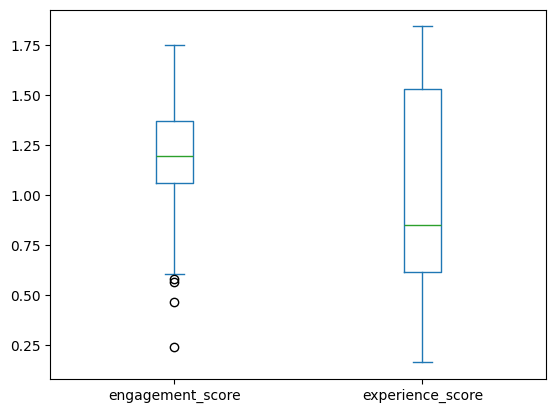

In [34]:
user_satisfaction_df.plot.box()

There are no outliers.

In [35]:
scaler = StandardScaler()
scaled_array = scaler.fit_transform(user_satisfaction_df)
scaled_array
pd.DataFrame(scaled_array).head(5)

,0,1
0,-1.14,-0.85
1,1.20,0.50
2,-0.82,-0.85
3,0.08,0.07
4,-2.14,-0.76


In [36]:
data_normalized = normalize(scaled_array)
pd.DataFrame(data_normalized).head(5)

,0,1
0,-0.80,-0.60
1,0.92,0.38
2,-0.69,-0.72
3,0.75,0.66
4,-0.94,-0.34


In [37]:
kmeans = KMeans(n_clusters=2, random_state=42).fit(data_normalized)
kmeans.labels_

array([0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0,
       0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1,
       0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0,
       0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0,
       0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1,
       0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1,
       0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 1, 0, 0,
       0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0],
      dtype=int32)

In [38]:
user_satisfaction_df.insert(0, 'cluster', kmeans.labels_)
user_satisfaction_df.head(5)

,cluster,engagement_score,experience_score
MSISDN/Number,,,
33601024000.00,0,0.92,0.59
33601280000.00,1,1.48,1.25
33601792000.00,0,0.99,0.59
33603072000.00,1,1.21,1.04
33603584000.00,0,0.68,0.64


In [39]:
user_satisfaction_df['cluster'].value_counts()

cluster
0    155
1    107
Name: count, dtype: int64

In [36]:
#fig = px.scatter(user_satisfaction_df, x='engagement_score', y="experience_score",
#                 color='cluster')
#Image(pio.to_image(fig, format='png', width=1200))

In [39]:
fig = px.scatter(user_satisfaction_df, x='engagement_score', y='experience_score',
                 color='cluster')#, size='satisfaction_score')
fig.show()

In [40]:
user_satisfaction_df.to_csv('../src/data/TellCo_user_satisfaction.csv')

Aggregate the average satisfaction & experience score per cluster.


In [41]:
user_satisfaction_df.groupby('cluster').agg(
    {'engagement_score': 'sum', 'experience_score': 'sum'})

,engagement_score,experience_score
cluster,,
0,163.48,107.74
1,148.96,156.29


Cluster 1 has higher Engagement and satisfaction score. 
Cluster 2 has vert low expirience score but higher engagement score.

Export your final table containing all user id + engagement, experience & satisfaction scores in your local MySQL database. Report a screenshot of a select query output on the exported table.


Model deployment tracking - deploy the model and monitor your model. Here you can use MlOps tools which can help you to track your model’s change.  Your model tracking report includes code version, start and end time, source, parameters, metrics(loss convergence) and artifacts or any output file regarding each specific run. (CSV file, screenshot)
